<a href="https://colab.research.google.com/github/Leanse1/Tracking-people-texting-on-streets/blob/main/Tracking_people_texting_on_streets_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Few days back I watched this video on Youtube**     
Link: https://www.youtube.com/watch?v=tm2lfv3_ELc

Every year around 1000+ lives lost in India due to usage of mobilephones [click_here](https://timesofindia.indiatimes.com/gadgets-news/1040-lives-lost-in-road-accidents-due-to-use-of-mobile-phone-while-driving/articleshow/96678450.cms). Gen-Z addiction to mobilephones is causing some serious trouble in society.

In future, governments may fine pedestrians using devices on street. So me being a computer vision engineer why cant build a prototype for that.


The idea is just to track only the people texting in streets. People talking in mobile phones are not included as their eyes are still on the street

I downloaded 400 images from internet and annotated in roboflow as two different classes
1.   People using devices (texting)
2.   People not using devices

I didn't use COCO dataset as it may dilute the dataset as imbalanced




In [ ]:
!pip install super_gradients

In [ ]:
!pip install supervision

In [ ]:
!pip install roboflow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="vSLqNlAbwI46rXUil85o")
project = rf.workspace("leanse-sangeerth-6o0b2").project("detecting-mobile-users")
dataset = project.version(1).download("yolov8")


In [22]:

from super_gradients.training import Trainer
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train,
    coco_detection_yolo_format_val
)
from super_gradients.training import models
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import (
    DetectionMetrics_050,
    DetectionMetrics_050_095
)
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback
from tqdm.auto import tqdm

import os
import requests
import cv2
import matplotlib.pyplot as plt
import glob
import numpy as np
import random
import math

In [7]:
ROOT_DIR = '/content/Detecting-Mobile-users-1'
train_imgs_dir = 'train/images'
train_labels_dir = 'train/labels'
val_imgs_dir = 'valid/images'
val_labels_dir = 'valid/labels'
classes = ['Not-Using-any-device', 'Using-device']

In [8]:

dataset_params = {
    'data_dir':ROOT_DIR,
    'train_images_dir':train_imgs_dir,
    'train_labels_dir':train_labels_dir,
    'val_images_dir':val_imgs_dir,
    'val_labels_dir':val_labels_dir,
    'classes':classes
}

In [9]:
from IPython.display import clear_output

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)


clear_output()

Indexing dataset annotations: 100%|██████████| 14/14 [00:00<00:00, 3457.79it/s]


Indexing dataset annotations: 100%|██████████| 14/14 [00:00<00:00, 2714.38it/s]


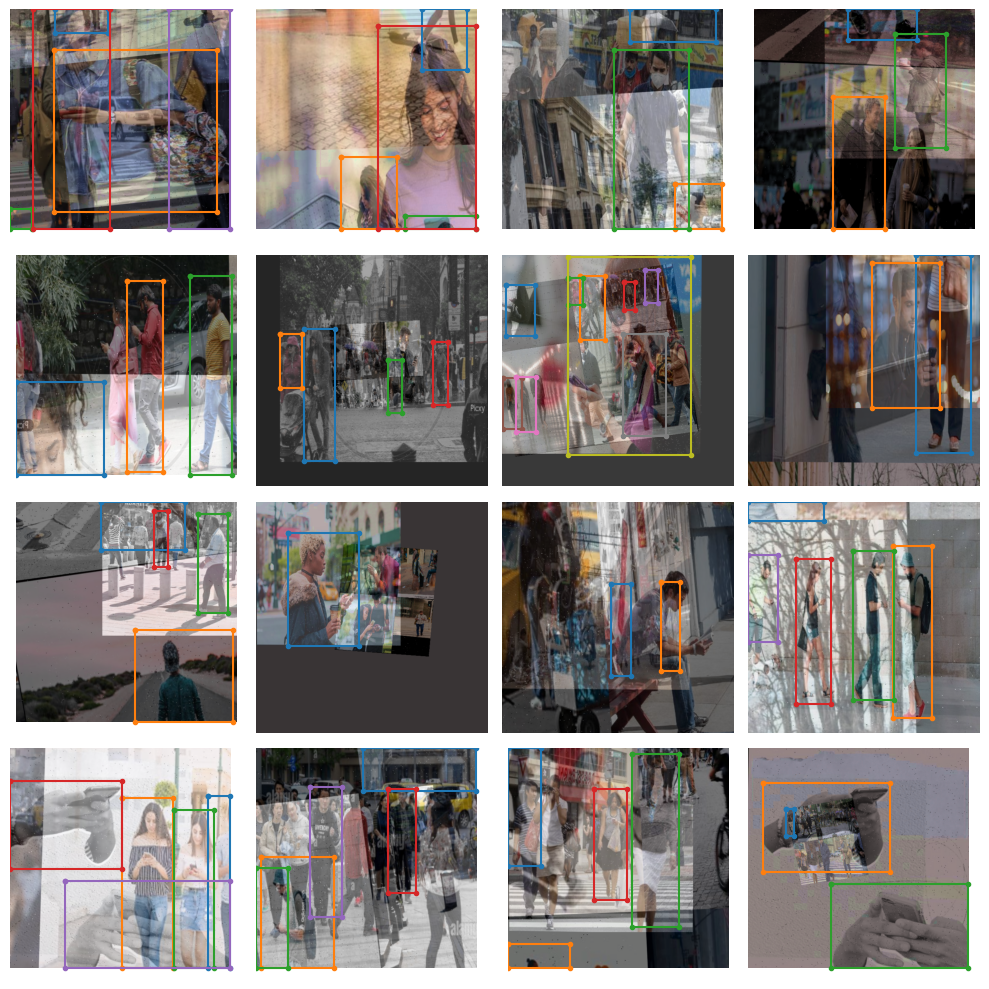

In [ ]:
train_data.dataset.plot()

In [ ]:
EPOCHS = 10
BATCH_SIZE = 16
WORKERS = 2

In [ ]:
train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        ),
        DetectionMetrics_050_095(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50:0.95'
}


In [ ]:
models_to_train = [
    'yolo_nas_l'
]


In [ ]:
CHECKPOINT_DIR = 'checkpoints'

In [ ]:
for model_to_train in models_to_train:
    trainer = Trainer(
        experiment_name=model_to_train,
        ckpt_root_dir=CHECKPOINT_DIR
    )

    model = models.get(
        model_to_train,
        num_classes=len(dataset_params['classes']),
        pretrained_weights="coco"
    )

    trainer.train(
        model=model,
        training_params=train_params,
        train_loader=train_data,
        valid_loader=val_data
    )

In [ ]:
best_model = models.get('yolo_nas_l',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path="/content/drive/MyDrive/ckpt_best (2).pth")

[2023-12-10 07:37:35] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/ckpt_best (2).pth EMA checkpoint.


I have purposefully reduced test and val dataset to give as much data to my training dataset. So that it can be checked on external dataset

Now let me test the best model on various images on internet!!!

[2023-12-06 17:28:45] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.


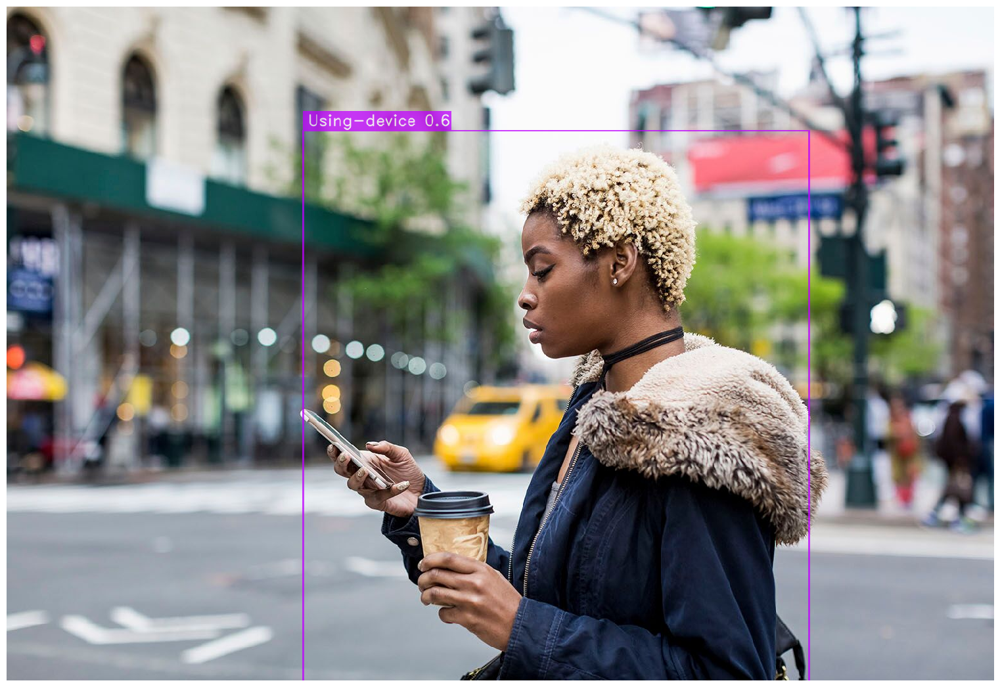

In [ ]:
test_image = '/content/Drupal-TheWell_twalking texting walking_GettyImages-909591006.jpg'
best_model.predict(test_image).show()

[2023-12-06 18:04:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


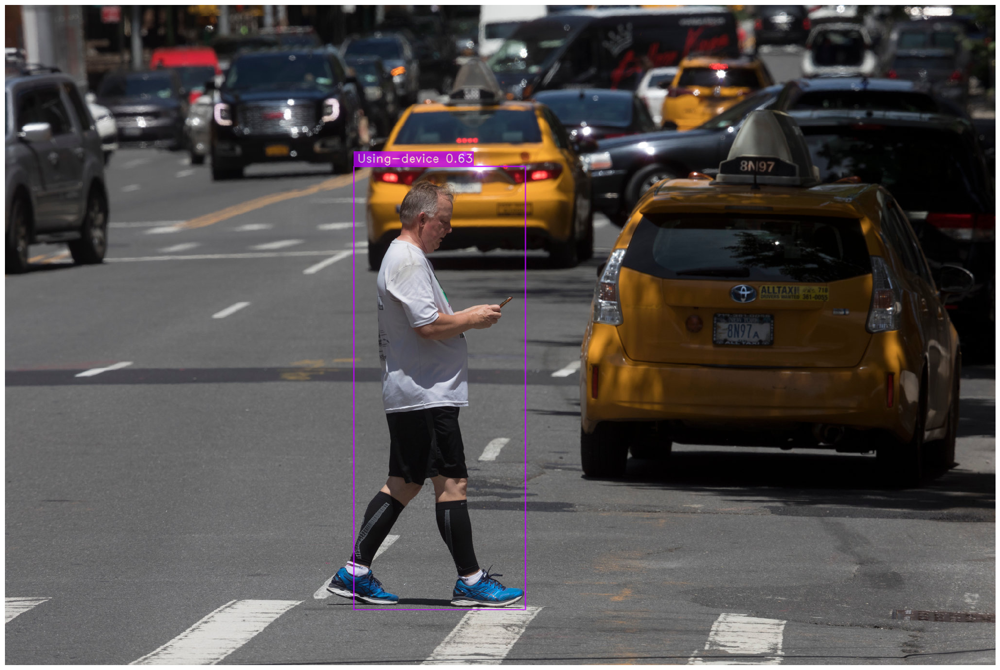

In [ ]:
test_image = '/content/merlin_155942391_3946d286-8063-42e2-b286-51cce5992915-superJumbo.jpg'
best_model.predict(test_image).show()

[2023-12-06 18:08:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


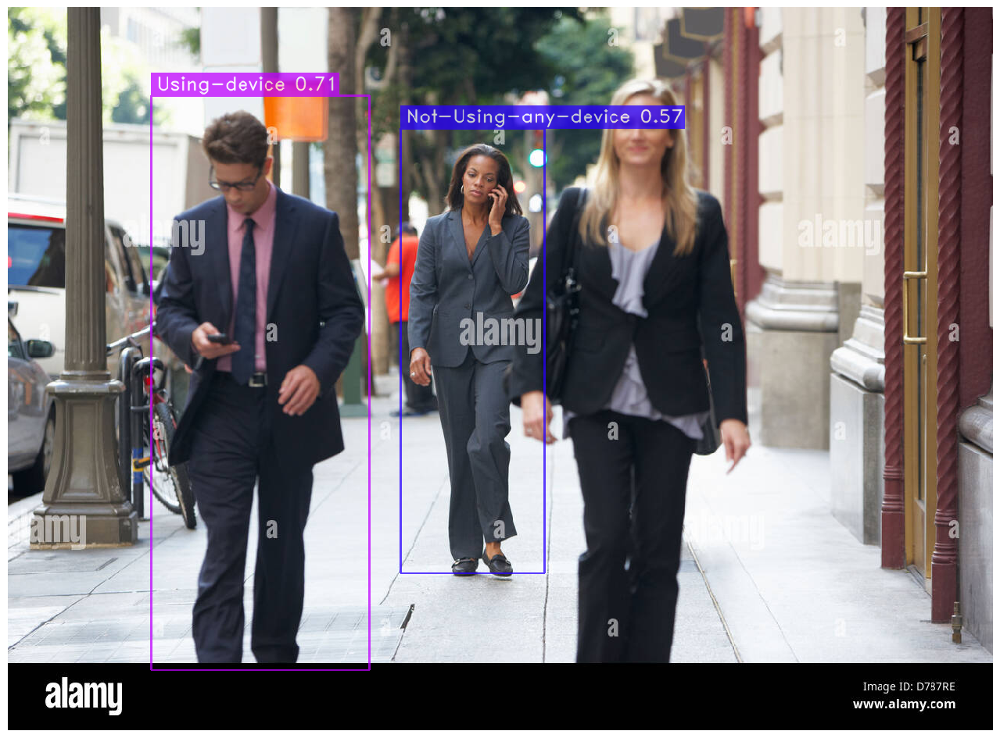

In [ ]:
test_image = '/content/group-of-businesspeople-walking-along-street-D787RE.jpg'
best_model.predict(test_image).show()

It indeed is right since we used only texting in using-device dataset. Let us try more

[2023-12-06 18:36:07] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


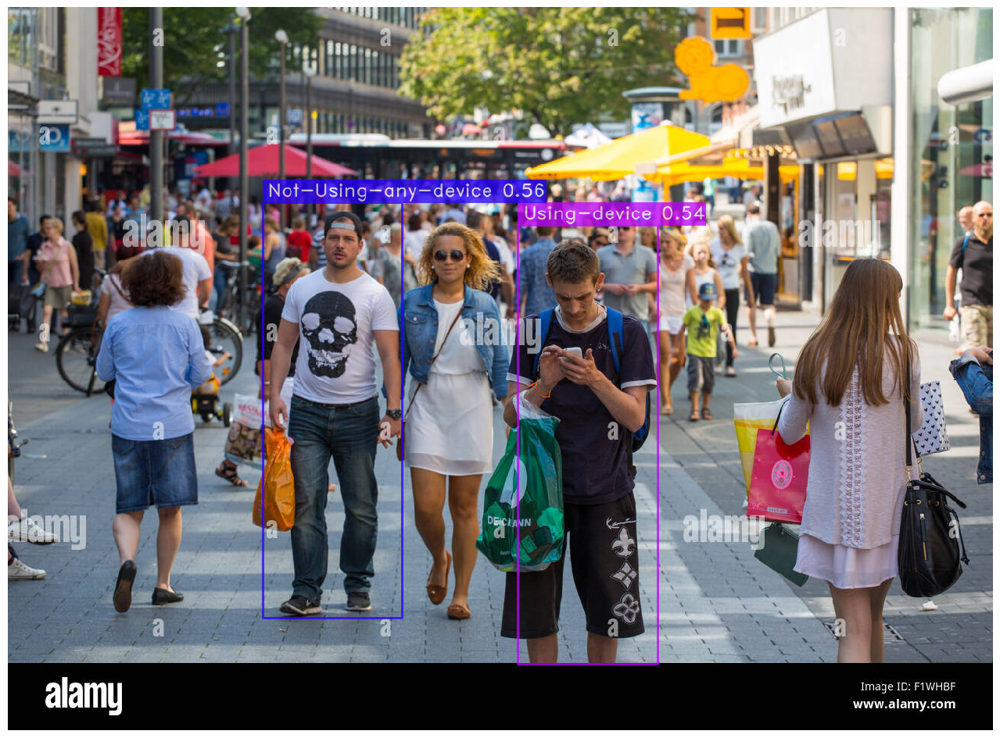

In [ ]:
test_image = '/content/young-man-paying-attention-at-social-media-on-his-mobile-smart-phone-F1WHBF.jpg'
best_model.predict(test_image).show()

Not bad for a 400 image dataset!!!!

[2023-12-06 18:23:14] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


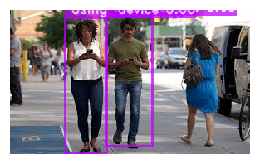

In [ ]:
test_image = '/content/images (2).jpg'
best_model.predict(test_image).show()

[2023-12-06 18:40:03] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


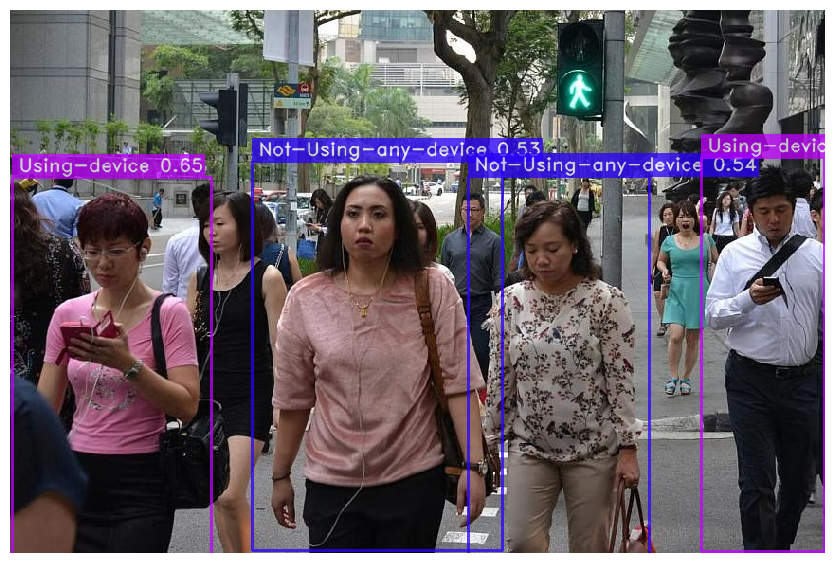

In [ ]:
test_image = '/content/ST_20141109_BAPHONE8HV0_806315e_2x.jpeg'
best_model.predict(test_image).show()

[2023-12-06 18:33:21] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


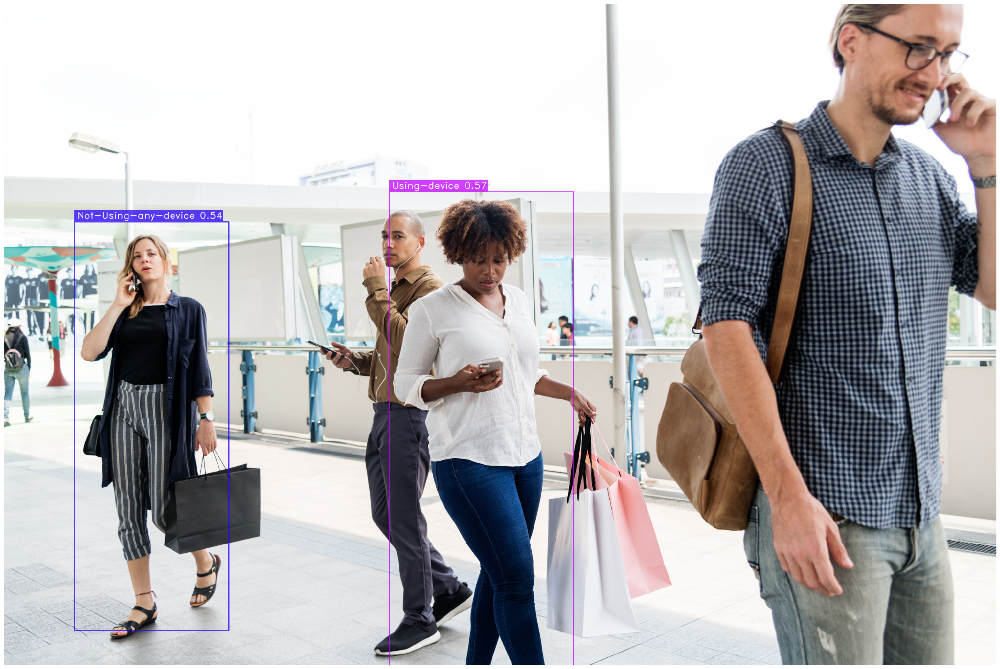

In [ ]:
test_image = '/content/Crowd_of_people_with_phones.jpg'
best_model.predict(test_image).show()

Ok the model is doing too good with images!!!!!!!

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
model = models.get('yolo_nas_l',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path="/content/drive/MyDrive/Datasets/ckpt_best (2).pth")

[2023-12-10 13:45:14] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Datasets/ckpt_best (2).pth EMA checkpoint.


In [12]:
input_video_path = "/content/People walking into things whilst texting compilation (online-video-cutter.com).mp4"
output_video_path = "/content/output"


In [13]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [14]:
torch.cuda.get_device_name(0)

'Tesla T4'

In [15]:
from IPython import display
display.clear_output()

In [16]:
!gdown "https://drive.google.com/uc?id=11ZSZcG-bcbueXZC3rN08CM0qqX3eiHxf&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=11ZSZcG-bcbueXZC3rN08CM0qqX3eiHxf&confirm=t
To: /content/deep_sort_pytorch.zip
100% 43.1M/43.1M [00:00<00:00, 297MB/s]


In [ ]:
!unzip /content/deep_sort_pytorch.zip

In [44]:
%cd /content/

/content


In [18]:
from deep_sort_pytorch.utils.parser import get_config
from deep_sort_pytorch.deep_sort import DeepSort

cfg_deep = get_config()
cfg_deep.merge_from_file("/content/deep_sort_pytorch/configs/deep_sort.yaml")
deepsort = DeepSort(cfg_deep.DEEPSORT.REID_CKPT,
                    max_dist=cfg_deep.DEEPSORT.MAX_DIST, min_confidence=cfg_deep.DEEPSORT.MIN_CONFIDENCE,
                    nms_max_overlap=cfg_deep.DEEPSORT.NMS_MAX_OVERLAP,
                    max_iou_distance=cfg_deep.DEEPSORT.MAX_IOU_DISTANCE,
                    max_age=cfg_deep.DEEPSORT.MAX_AGE, n_init=cfg_deep.DEEPSORT.N_INIT,
                    nn_budget=cfg_deep.DEEPSORT.NN_BUDGET,
                    use_cuda=True)

[2023-12-10 13:47:45] INFO - feature_extractor.py - Loading weights from deep_sort_pytorch/deep_sort/deep/checkpoint/ckpt.t7... Done!


In [19]:
cap = cv2.VideoCapture("/content/People walking into things whilst texting compilation (online-video-cutter.com).mp4")

frame_width = int(cap.get(3))
frame_height = int(cap.get(4))


out = cv2.VideoWriter('output2.avi', cv2.VideoWriter_fourcc('M', 'J', 'P', 'G'), 10, (frame_width, frame_height))

In [20]:
classNames = ['Not-Using-any-device', 'Using-device']

In [21]:
def draw_boxes(img, bbox, identities=None, categories=None, names=None, offset=(0,0)):
    for i, box in enumerate(bbox):
        x1, y1,  x2, y2 = [int(i) for i in box]
        x1 += offset[0]
        x2 += offset[0]
        y1 += offset[0]
        y2 += offset[0]
        cat = int(categories[i]) if categories is not None else 0
        id = int(identities[i]) if identities is not None else 0
        label = str(id) + ":" + classNames[cat]
        (w,h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX,0.6,1)
        cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 255), 3)
        cv2.rectangle(frame, (x1, y1-20), (x1+w, y1), (255, 144, 30), -1)
        cv2.putText(frame, label, (x1, y1 -5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, [255, 255, 255], 1)
    return img

In [ ]:
while True:
    xywh_bboxs = []
    confs = []
    oids = []   # object ids
    outputs = []
    ret, frame = cap.read()
    if ret:
        result = list(model.predict(frame, conf=0.5))[0]
        bbox_xyxys = result.prediction.bboxes_xyxy.tolist()
        confidences = result.prediction.confidence
        labels = result.prediction.labels.tolist()
        for (bbox_xyxy, confidence, cls) in zip(bbox_xyxys, confidences, labels):
            bbox = np.array(bbox_xyxy)
            x1, y1, x2, y2 = bbox[0], bbox[1], bbox[2], bbox[3]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
            conf = math.ceil((confidence * 100)) / 100
            cx, cy = int((x1 + x2) / 2), int((y1 + y2) / 2)
            bbox_width = abs(x1 - x2)
            bbox_height = abs(y1 - y2)
            xcycwh = [cx, cy, bbox_width, bbox_height]
            xywh_bboxs.append(xcycwh)
            confs.append(conf)
            oids.append(int(cls))

       # convert to tensor for tracking
        xywhs = torch.tensor(xywh_bboxs)
        confss = torch.tensor(confs)
        oids = torch.tensor(oids)

        # Check if the xywhs tensor is non-empty
        if len(xywhs) > 0:
            outputs = deepsort.update(xywhs, confss, oids, frame)
            # outputs = array(x1,y1,x2,y2, conf, object_id )
            if len(outputs) > 0:
                bbox_xyxy = outputs[:, :4]
                identities = outputs[:, 4]
                object_id = outputs[:, 5]
                draw_boxes(frame, bbox_xyxy, identities, object_id)

        out.write(frame)
    else:
        break

cap.release()
out.release()
